In [2]:
import os
import urllib
import cv2
import numpy as np
from pixellib.semantic import semantic_segmentation
from matplotlib import pyplot as plt

(1440, 1080, 3)


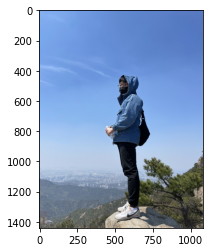

In [3]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/photo_me_1.jpeg'  
img_orig = cv2.imread(img_path) 
# img_orig=ani_orig
print(img_orig.shape)

plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

(1440, 1080, 3)


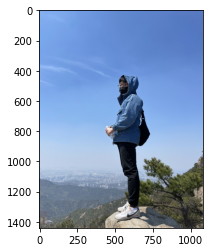

In [4]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/'  

img_orig = cv2.imread(img_path+'photo_me_1.jpeg') #me
hum_orig = cv2.imread(img_path+'photo_5.jpeg') #human
ani_orig = cv2.imread(img_path+'photo_7.jpeg') #horse

print(img_orig.shape)

plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [5]:
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models' 
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5') 

# PixelLib가 제공하는 모델의 url입니다
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5' 

# 다운로드를 시작합니다
urllib.request.urlretrieve(model_url, model_file) # urllib 패키지 내에 있는 request 모듈의 urlretrieve 함수를 이용해서 model_url에 있는 파일을 다운로드 해서 model_file 파일명으로 저장

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7ff898425a90>)

In [6]:
model = semantic_segmentation() 
model.load_pascalvoc_model(model_file)

In [7]:
segvalues, output = model.segmentAsPascalvoc(img_path+'photo_me_1.jpeg') 

In [8]:
#pascalvoc 데이터의 라벨종류
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

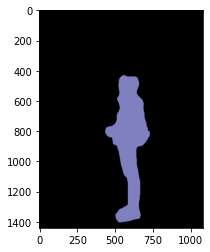

In [9]:
#segmentAsPascalvoc() 함수 를 호출하여 입력된 이미지를 분할한 뒤 나온 결과값 중 output을 matplotlib을 이용해 출력
plt.imshow(output)
plt.show()

In [10]:
segvalues # segmentAsPascalvoc() 함수를 호출하여 입력된 이미지를 분할한 뒤 나온 결과값 중 배열값을 출력

{'class_ids': array([ 0, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [11]:
#segvalues에 있는 class_ids를 담겨있는 값을 통해 pacalvoc에 담겨있는 라벨을 출력
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
person


In [12]:
# 아래 코드를 이해하지 않아도 좋습니다
# PixelLib에서 그대로 가져온 코드입니다
# 주목해야 할 것은 생성 코드 결과물이예요!

#컬러맵 만들기 
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

len(colormap[:]) #생성한 20개의 컬러맵 


# seg_color 반환 함수
def get_colormap(label_name):
    # 아래 코드를 이해하지 않아도 좋습니다
    # PixelLib에서 그대로 가져온 코드입니다
    # 주목해야 할 것은 생상 코드 결과물이예요!
    colormap = np.zeros((256, 3), dtype = int)
    ind = np.arange(256, dtype=int)

    for shift in reversed(range(8)):
        for channel in range(3):
            colormap[:, channel] |= ((ind >> channel) & 1) << shift
        ind >>= 3

    # colormap[:20]

    index = LABEL_NAMES.index(label_name)  # 데이터 라벨 인덱스
    seg_color = colormap[index].tolist()  # BGR
    seg_color = seg_color[::-1]  # BGR2RGB
    return seg_color  # RGB

In [13]:
colormap[15]

array([192, 128, 128])

In [14]:
seg_color = (128,128,192) # 색상순서 변경 - colormap의 배열은 RGB 순이며 output의 배열은 BGR 순서로 채널 배치가 되어 있어서
# seg_color = (64,128,0) # 색상순서 변경 - colormap의 배열은 RGB 순이며 output의 배열은 BGR 순서로 채널 배치가 되어 있어서

(1440, 1080)


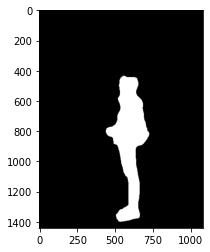

In [15]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
# seg_color 값이 person을 값이 므로 사람이 있는 위치를 제외하고는 gray로 출력
# cmap 값을 변경하면 다른 색상으로 확인이 가능함
seg_map = np.all(output==seg_color, axis=-1) 
print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray')
plt.show()

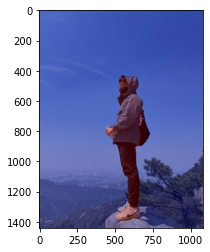

In [16]:
# 원본이미지를 img_show에 할당한뒤 이미지 사람이 있는 위치와 배경을 분리해서 표현한 color_mask 를 만든뒤 두 이미지를 합쳐서 출력
img_show = img_orig.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

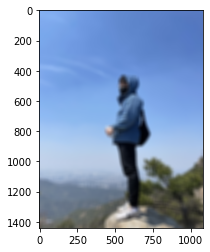

In [17]:
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (30,30))

# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

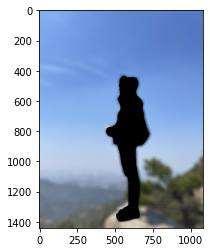

In [18]:
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경) 
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)

# cv2.bitwise_not(): 이미지가 반전됩니다. 배경이 0 사람이 255 였으나
# 연산을 하고 나면 배경은 255 사람은 0입니다.
img_bg_mask = cv2.bitwise_not(img_mask_color)

# cv2.bitwise_and()을 사용하면 배경만 있는 영상을 얻을 수 있습니다.
# 0과 어떤 수를 bitwise_and 연산을 해도 0이 되기 때문에 
# 사람이 0인 경우에는 사람이 있던 모든 픽셀이 0이 됩니다. 결국 사람이 사라지고 배경만 남아요!
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

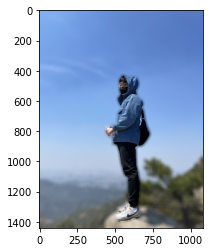

In [19]:
# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니 
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

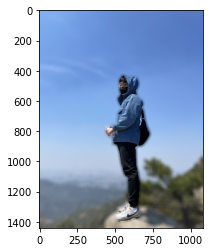

In [20]:
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

(-0.5, 719.5, 719.5, -0.5)

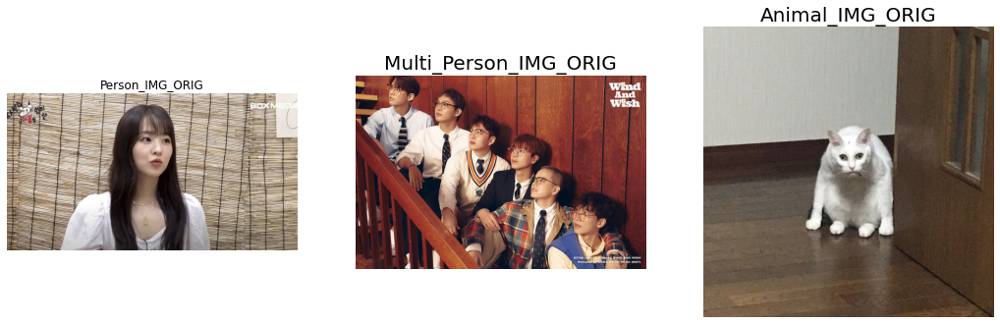

In [21]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/'  

img_orig = cv2.imread(img_path+'photo_me_1.jpeg') #me
mi_hum_orig = cv2.imread(img_path+'photo_4.jpg') #multi human
hum_orig = cv2.imread(img_path+'photo_5.jpeg') #human
ani_orig = cv2.imread(img_path+'Photo_cat.jpeg') #horse

plt.figure(figsize=(18,12))

plt.subplot(131)
plt.imshow(cv2.cvtColor(hum_orig, cv2.COLOR_BGR2RGB))
plt.title('Person_IMG_ORIG')
plt.rc('axes', titlesize=20)
plt.axis('off')

plt.subplot(132)
plt.imshow(cv2.cvtColor(mi_hum_orig, cv2.COLOR_BGR2RGB))
plt.title('Multi_Person_IMG_ORIG')
plt.rc('axes', titlesize=20)
plt.axis('off')

plt.subplot(133)
plt.imshow(cv2.cvtColor(ani_orig, cv2.COLOR_BGR2RGB))
plt.title('Animal_IMG_ORIG')
plt.rc('axes', titlesize=20)
plt.axis('off')


# plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
# plt.show()

In [22]:
model = semantic_segmentation() 
model.load_pascalvoc_model(model_file)

In [23]:
def seg_picture(path,load):
    segvalues, output = model.segmentAsPascalvoc(path+load)
    return segvalues, output

(-0.5, 719.5, 719.5, -0.5)

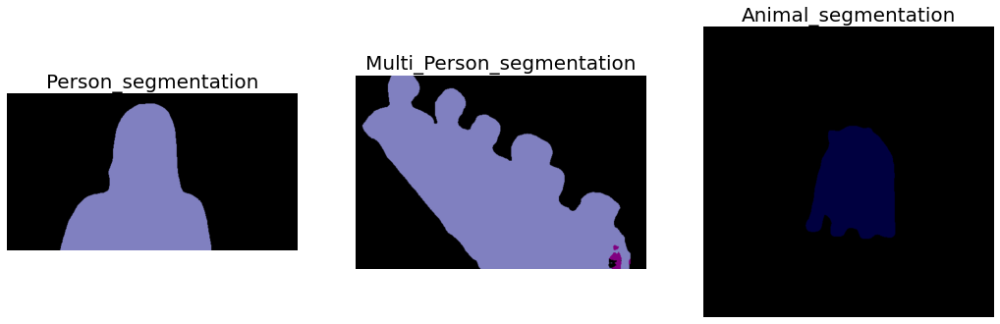

In [24]:
plt.figure(figsize=(18,12))

plt.subplot(131)
plt.imshow(seg_picture(img_path,'photo_5.jpeg')[1])
plt.title('Person_segmentation')
plt.rc('axes', titlesize=20)
plt.axis('off')

plt.subplot(132)
plt.imshow(seg_picture(img_path,'photo_4.jpg')[1])
plt.title('Multi_Person_segmentation')
plt.rc('axes', titlesize=20)
plt.axis('off')

plt.subplot(133)
plt.imshow(seg_picture(img_path,'Photo_cat.jpeg')[1])
plt.title('Animal_segmentation')
plt.rc('axes', titlesize=20)
plt.axis('off')

In [25]:
# seg_color 반환 함수
def get_colormap(label_name):
    # 아래 코드를 이해하지 않아도 좋습니다
    # PixelLib에서 그대로 가져온 코드입니다
    # 주목해야 할 것은 생상 코드 결과물이예요!
    colormap = np.zeros((256, 3), dtype = int)
    ind = np.arange(256, dtype=int)

    for shift in reversed(range(8)):
        for channel in range(3):
            colormap[:, channel] |= ((ind >> channel) & 1) << shift
        ind >>= 3

    # colormap[:20]

    index = LABEL_NAMES.index(label_name)  # 데이터 라벨 인덱스
    seg_color = colormap[index].tolist()  # BGR
    seg_color = seg_color[::-1]  # BGR2RGB
    return seg_color  # RGB

# seg_picture(path,load)
def remove_picture(picture,a,label_name):
    #블러 이미지 생성
    img_orig_blur = cv2.blur(picture, (30,30))
    seg_color = get_colormap(label_name)
    seg_map = np.all(seg_picture(img_path,a)[1]==seg_color, axis=-1)
    img_mask = seg_map.astype(np.uint8) * 255
    img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR) #입력 이미지의 색상 채널을 변경
    img_bg_mask = cv2.bitwise_not(img_mask_color)
    img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
    return img_bg_blur,img_mask_color


(-0.5, 719.5, 719.5, -0.5)

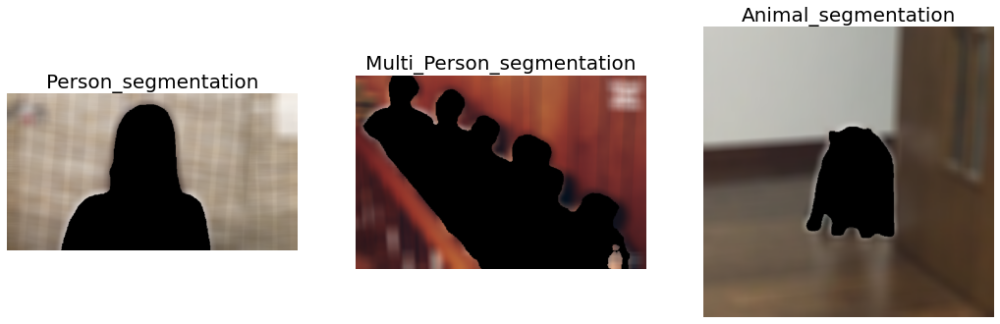

In [26]:
a=remove_picture(hum_orig,'photo_5.jpeg','person')[0]
b=remove_picture(mi_hum_orig,'photo_4.jpg','person')[0]
c=remove_picture(ani_orig,'Photo_cat.jpeg','cat')[0]

a_1=remove_picture(hum_orig,'photo_5.jpeg','person')[1]
b_1=remove_picture(mi_hum_orig,'photo_4.jpg','person')[1]
c_1=remove_picture(ani_orig,'Photo_cat.jpeg','cat')[1]


plt.figure(figsize=(18,12))

plt.subplot(131)
plt.imshow(cv2.cvtColor(a, cv2.COLOR_BGR2RGB))
plt.title('Person_segmentation')
plt.rc('axes', titlesize=20)
plt.axis('off')

plt.subplot(132)
plt.imshow(cv2.cvtColor(b, cv2.COLOR_BGR2RGB))
plt.title('Multi_Person_segmentation')
plt.rc('axes', titlesize=20)
plt.axis('off')

plt.subplot(133)
plt.imshow(cv2.cvtColor(c, cv2.COLOR_BGR2RGB))
plt.title('Animal_segmentation')
plt.rc('axes', titlesize=20)
plt.axis('off')

(-0.5, 719.5, 719.5, -0.5)

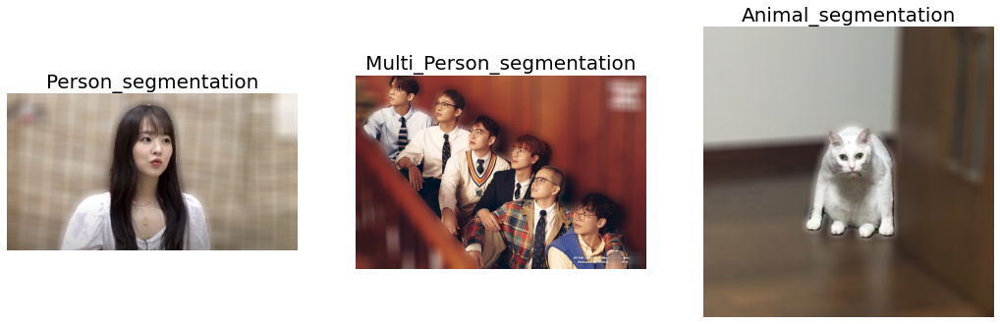

In [27]:
plt.figure(figsize=(18,12))

plt.subplot(131)
plt.imshow(cv2.cvtColor(np.where(a_1==255, hum_orig, a), cv2.COLOR_BGR2RGB))
plt.title('Person_segmentation')
plt.rc('axes', titlesize=20)
plt.axis('off')

plt.subplot(132)
plt.imshow(cv2.cvtColor(np.where(b_1==255, mi_hum_orig, b), cv2.COLOR_BGR2RGB))
plt.title('Multi_Person_segmentation')
plt.rc('axes', titlesize=20)
plt.axis('off')

plt.subplot(133)
plt.imshow(cv2.cvtColor(np.where(c_1==255, ani_orig, c), cv2.COLOR_BGR2RGB))
plt.title('Animal_segmentation')
plt.rc('axes', titlesize=20)
plt.axis('off')


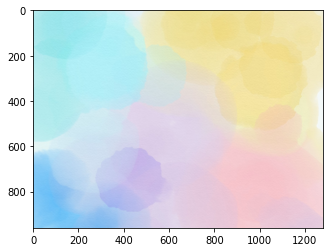

In [28]:
# smearing-5556288_1280.jpeg
back_orig = cv2.imread(img_path+'smearing-5556288_1280.jpeg')
plt.imshow(back_orig)
plt.show()

In [30]:
print(back_orig.shape)
print(hum_orig.shape)
print(mi_hum_orig.shape)
print(ani_orig.shape)

(960, 1280, 3)
(367, 680, 3)
(467, 700, 3)
(720, 720, 3)


In [32]:
# 방법 1. dsize = (width, height)

hum_back_orig_resized = cv2.resize(back_orig, dsize=(680,367), interpolation=cv2.INTER_LINEAR)
mi_hum_back_orig_resized = cv2.resize(back_orig, dsize=(700,467), interpolation=cv2.INTER_LINEAR)
ani_back_orig_resized = cv2.resize(back_orig, dsize=(720,720), interpolation=cv2.INTER_LINEAR)

print(hum_back_orig_resized.shape) # (367, 680, 3)
print(mi_hum_back_orig_resized.shape) 
print(ani_back_orig_resized.shape) 

(367, 680, 3)
(467, 700, 3)
(720, 720, 3)


(-0.5, 719.5, 719.5, -0.5)

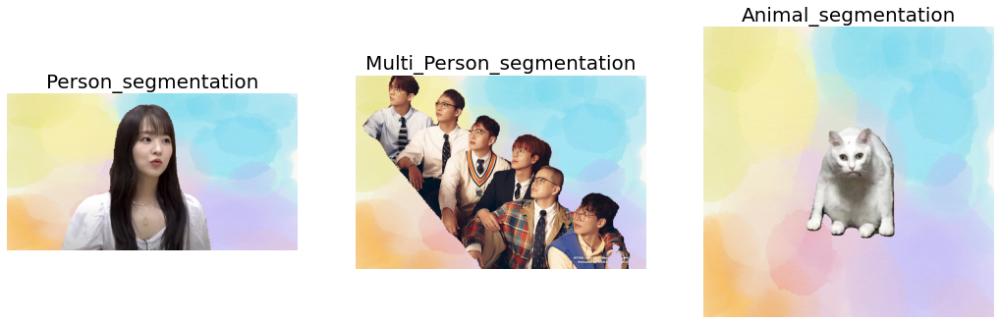

In [41]:
plt.figure(figsize=(18,12))

plt.subplot(131)
plt.imshow(cv2.cvtColor(np.where(a_1==255, hum_orig, hum_back_orig_resized), cv2.COLOR_BGR2RGB))
plt.title('Person_segmentation')
plt.rc('axes', titlesize=20)
plt.axis('off')

plt.subplot(132)
plt.imshow(cv2.cvtColor(np.where(b_1==255, mi_hum_orig, mi_hum_back_orig_resized), cv2.COLOR_BGR2RGB))
plt.title('Multi_Person_segmentation')
plt.rc('axes', titlesize=20)
plt.axis('off')

plt.subplot(133)
plt.imshow(cv2.cvtColor(np.where(c_1==255, ani_orig, ani_back_orig_resized), cv2.COLOR_BGR2RGB))
plt.title('Animal_segmentation')
plt.rc('axes', titlesize=20)
plt.axis('off')

(-0.5, 679.5, 366.5, -0.5)

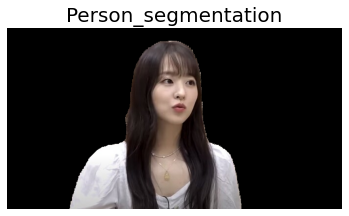

In [42]:
# plt.subplot(131)
plt.imshow(cv2.cvtColor(np.where(a_1==255, hum_orig, 0), cv2.COLOR_BGR2RGB))
plt.title('Person_segmentation')
plt.rc('axes', titlesize=20)
plt.axis('off')

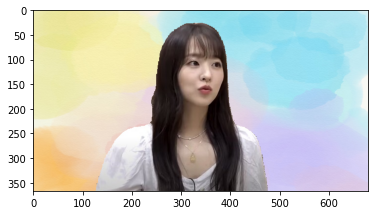

In [51]:
plt.imshow(cv2.cvtColor(np.where(a_1==255, hum_orig, hum_back_orig_resized), cv2.COLOR_BGR2RGB))

In [56]:
# img = cv2.imread(imgfile, cv2.IMREAD_GRAYSCALE)
# cv2.cvtColor(np.where(c_1==255, ani_orig, ani_back_orig_resized), cv2.COLOR_BGR2RGB)
cv2.imwrite(img_path+'test.jpeg',cv2.cvtColor(np.where(a_1==255, hum_orig, hum_back_orig_resized), cv2.COLOR_RGB2BGR))
plt.imsave(img_path+'person.jpeg', cv2.cvtColor(np.where(a_1==255, hum_orig, hum_back_orig_resized), cv2.COLOR_RGB2BGR))
plt.imsave(img_path+'multi_person.jpeg', cv2.cvtColor(np.where(b_1==255, mi_hum_orig, mi_hum_back_orig_resized), cv2.COLOR_BGR2RGB))
plt.imsave(img_path+'animal.jpeg', cv2.cvtColor(np.where(c_1==255, ani_orig, ani_back_orig_resized), cv2.COLOR_BGR2RGB))

In [ ]:
back_img_show = BACK_IMG_ORIG.copy()

refined_y = 200
refined_x = 400

alpha = 0.2  # 투명도
sticker_area = back_img_show[refined_y:refined_y+cat_img_resize.shape[0], refined_x:refined_x+cat_img_resize.shape[1]]
back_img_show[refined_y:refined_y +cat_img_resize.shape[0], refined_x:refined_x+cat_img_resize.shape[1]] = \
cv2.addWeighted(sticker_area, alpha, np.where(cat_img_resize==0,sticker_area,cat_img_resize).astype(np.uint8), 1-alpha, 0)  # 컬러 값 0(검은색)

- 이미지 확인 결과 명확하게 구분하지 못하는 문제점을 지니고 있었음
- 또한 2번째 이미지의 경우 바깥 머리카락이 잘려나가는 문제점이 있는 것을 확인

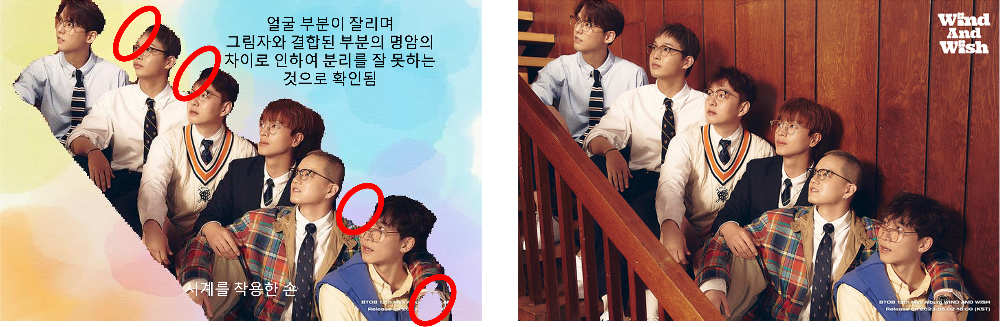

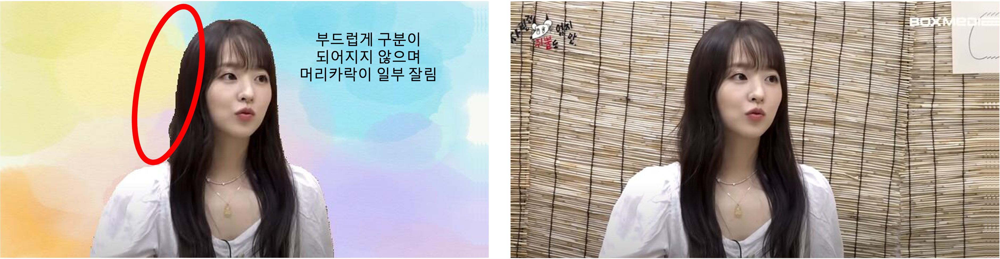

In [1]:
'''
시간부족으로 인하여 회고를 작성하지 못했습니다
Imwrite를 통하여 저장하면 사진이 BRG형태로 저장되어 imsave로 진행했습니다.
다른 배경과 결합하는 과정에서 기존 코드를 활용하기위하여 동일한 사진크기로 reshape하여 진행했습니다.
추후 다른 방식을 통하여 결합하는 과정을 찾아보도록 하겠습니다.
'''

'\n시간부족으로 인하여 회고를 작성하지 못했습니다\nImwrite를 통하여 저장하면 사진이 BRG형태로 저장되어 imsave로 진행했습니다.\n다른 배경과 결합하는 과정에서 기존 코드를 활용하기위하여 동일한 사진크기로 reshape하여 진행했습니다.\n추후 다른 방식을 통하여 결합하는 과정을 찾아보도록 하겠습니다.\n'